<a href="https://colab.research.google.com/github/kishanpandey11/-Customer-Lifetime-Value-prediction/blob/main/Predicting_Customer_Lifetime_Value.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
color = sns.color_palette()
sns.set_style('darkgrid')
import warnings
def ignore_warn(*args, **kwargs):
    pass
warnings.warn = ignore_warn

In [ ]:
df = pd.read_csv('/content/WA_Fn-UseC_-Marketing-Customer-Value-Analysis.csv')
pd.set_option('display.max_columns',None)
df.head()

,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,BU79786,Washington,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,56274,Suburban,Married,69,32,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,QZ44356,Arizona,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,0,Suburban,Single,94,13,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,AI49188,Nevada,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,48767,Suburban,Married,108,18,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,WW63253,California,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,0,Suburban,Married,106,18,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,HB64268,Washington,2813.692575,No,Basic,Bachelor,2/3/11,Employed,M,43836,Rural,Single,73,12,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize


In [ ]:
df.shape

(9134, 24)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9134 entries, 0 to 9133
Data columns (total 24 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Customer                       9134 non-null   object 
 1   State                          9134 non-null   object 
 2   Customer Lifetime Value        9134 non-null   float64
 3   Response                       9134 non-null   object 
 4   Coverage                       9134 non-null   object 
 5   Education                      9134 non-null   object 
 6   Effective To Date              9134 non-null   object 
 7   EmploymentStatus               9134 non-null   object 
 8   Gender                         9134 non-null   object 
 9   Income                         9134 non-null   int64  
 10  Location Code                  9134 non-null   object 
 11  Marital Status                 9134 non-null   object 
 12  Monthly Premium Auto           9134 non-null   i

### There are no missing values in the dataset

In [ ]:
df.dtypes.value_counts()

,count
object,16
int64,6
float64,2


In this Dataset customer Lifetime Value is the target variable.
1. Customer Lifetime Value is defined as, “The total value of direct and indirect contributions to overhead and profit by an individual customer during the entire customer lifecycle that is - from the start of the relationship until its projected ending”.
2. CLV evaluates the long-term value of customers with the company.
3. It is a powerful measure used not only to determine which clients have the most potential, but also to decide how much  marketing expenditures is justified for each segment.**

### Analyzing Target Variable

In [ ]:
df1 = df.copy(deep = True)
df['Customer Lifetime Value'].describe()

,Customer Lifetime Value
count,9134.000000
mean,8004.940475
std,6870.967608
min,1898.007675
25%,3994.251794
50%,5780.182197
75%,8962.167041
max,83325.381190


mu = 8004.94 and sigma = 6870.59


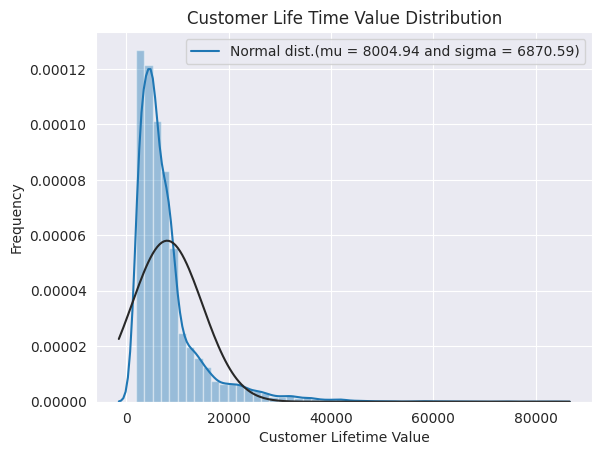

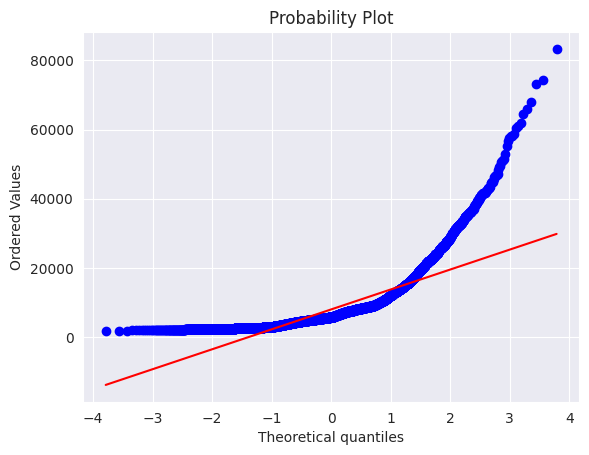

In [ ]:
from scipy import stats
from scipy.stats import norm,skew

sns.distplot(df1['Customer Lifetime Value'],fit=norm)

(mu,sigma) = norm.fit(df1['Customer Lifetime Value'])
print('mu = {:.2f} and sigma = {:.2f}'.format(mu,sigma))

plt.legend(['Normal dist.(mu = {:.2f} and sigma = {:.2f})'.format(mu,sigma)],loc = 'best')
plt.ylabel('Frequency')
plt.title('Customer Life Time Value Distribution')

## Q-Q PLOT
fig = plt.figure()
res = stats.probplot(df1['Customer Lifetime Value'],plot = plt)
plt.show()

#### The distribution plot indicates that the target variable is right skewed with a skewness of 3.03.
#### Indicates presence of outliers.
#### So it is important to transform it before applying linear models. I have applied log transformation on the target variable.

mu = 8.75 and sigma = 0.65


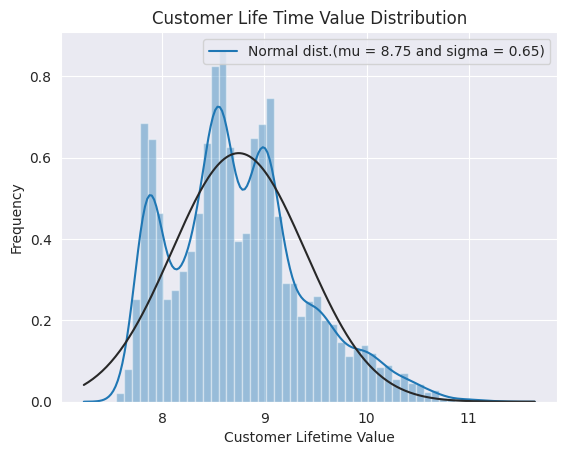

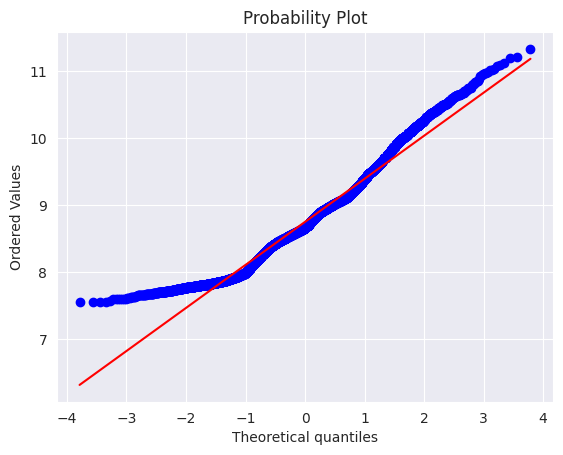

In [ ]:
df1['Customer Lifetime Value'] = np.log1p(df1['Customer Lifetime Value'])
sns.distplot(df1['Customer Lifetime Value'],fit=norm)

(mu,sigma) = norm.fit(df1['Customer Lifetime Value'])
print('mu = {:.2f} and sigma = {:.2f}'.format(mu,sigma))

plt.legend(['Normal dist.(mu = {:.2f} and sigma = {:.2f})'.format(mu,sigma)],loc = 'best')
plt.ylabel('Frequency')
plt.title('Customer Life Time Value Distribution')

## Q-Q PLOT
fig = plt.figure()
res = stats.probplot(df1['Customer Lifetime Value'],plot = plt)
plt.show()

In [ ]:
print('skewness before transformation:',df['Customer Lifetime Value'].skew())
print('skewness after transformation:',df1['Customer Lifetime Value'].skew())

skewness before transformation: 3.0322802599299847
skewness after transformation: 0.5761717967456804


In [ ]:
df1 = df1.drop(['Customer','Customer Lifetime Value','Effective To Date'],axis = 1)
df_cat1 = df1.select_dtypes(include = ['object'])
df_cat1.columns

Index(['State', 'Response', 'Coverage', 'Education', 'EmploymentStatus',
       'Gender', 'Location Code', 'Marital Status', 'Policy Type', 'Policy',
       'Renew Offer Type', 'Sales Channel', 'Vehicle Class', 'Vehicle Size'],
      dtype='object')

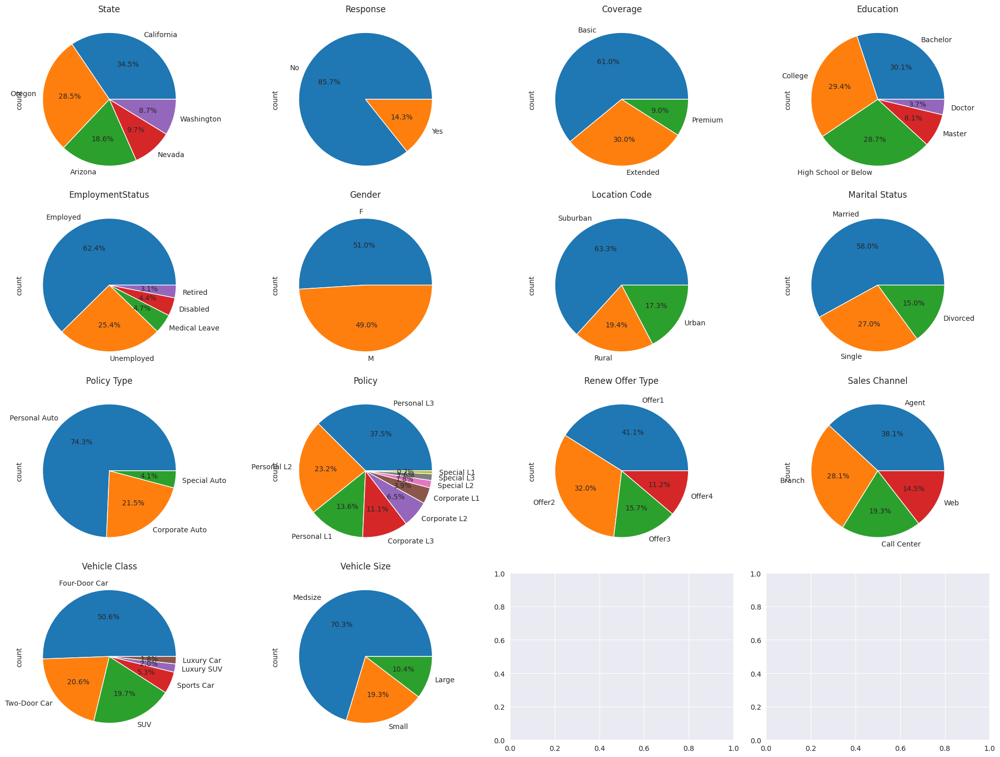

In [ ]:
fig, axes = plt.subplots(round(len(df_cat1.columns) / 4), 4, figsize=(20, 15))

for i, ax in enumerate(fig.axes):
    if i < len(df_cat1.columns):
        df[df_cat1.columns[i]].value_counts().plot.pie(autopct = '%1.1f%%',ax = ax)
        ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)
        ax.set_title(df_cat1.columns[i])

fig.tight_layout()

### The pie charts show the percentage of customers in each category of the categorical variables

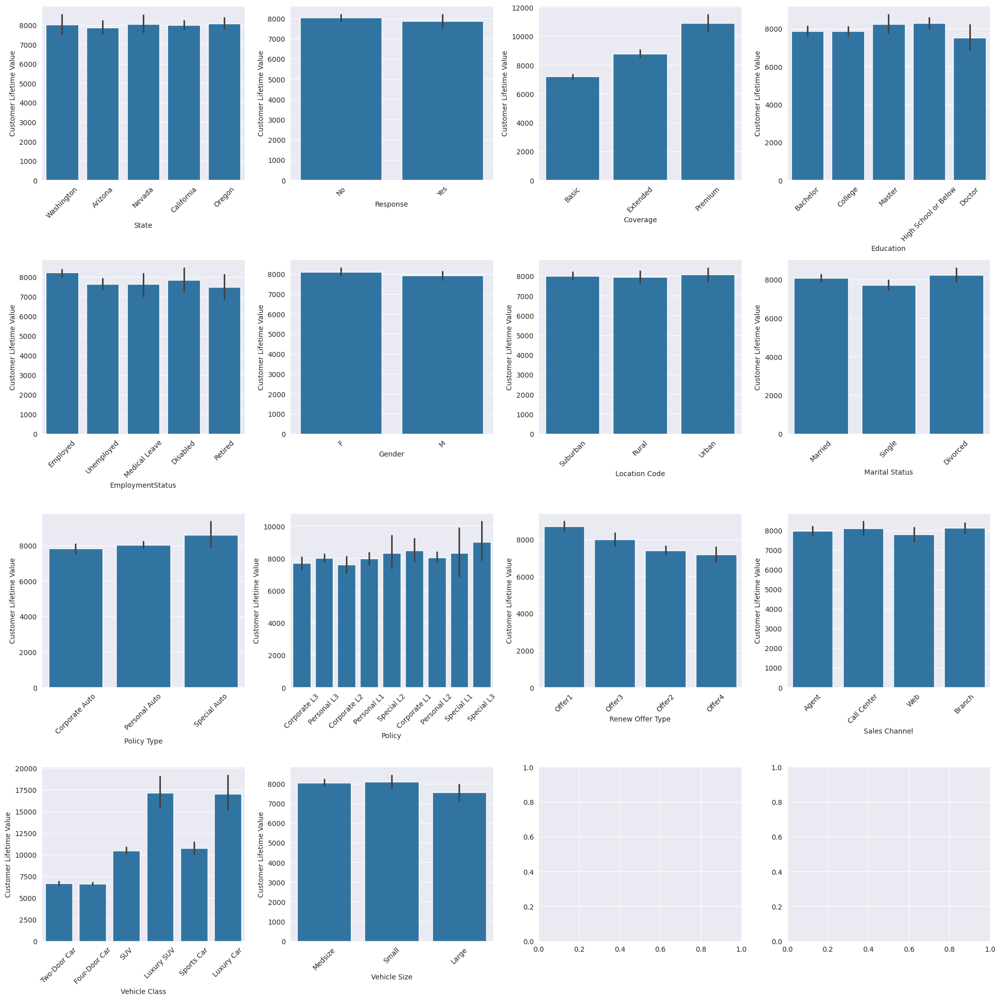

In [ ]:
fig, axes = plt.subplots(round(len(df_cat1.columns) / 4), 4, figsize=(20, 20))

for i, ax in enumerate(fig.axes):
    if i < len(df_cat1.columns):
        sns.barplot(x = df[df_cat1.columns[i]],y = df['Customer Lifetime Value'],data = df, ax = ax )
        ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=45)

fig.tight_layout()

### The bar charts show the average customer life time value of each categories in the Categorical features. From the bar chart itself we can observe that some of the features are insignificant like Response, Location code, Gender because the average customer lifetime value under each categories of these features are almost same.

In [ ]:
df_num = df.select_dtypes(include=['int64','float'])
df_num.columns

Index(['Customer Lifetime Value', 'Income', 'Monthly Premium Auto',
       'Months Since Last Claim', 'Months Since Policy Inception',
       'Number of Open Complaints', 'Number of Policies',
       'Total Claim Amount'],
      dtype='object')

In [ ]:
df_num_corr = df_num.corr()['Customer Lifetime Value'].sort_values(ascending=False)
df_num_corr

,Customer Lifetime Value
Customer Lifetime Value,1.000000
Monthly Premium Auto,0.396262
Total Claim Amount,0.226451
Income,0.024366
Number of Policies,0.021955
Months Since Last Claim,0.011517
Months Since Policy Inception,0.009418
Number of Open Complaints,-0.036343


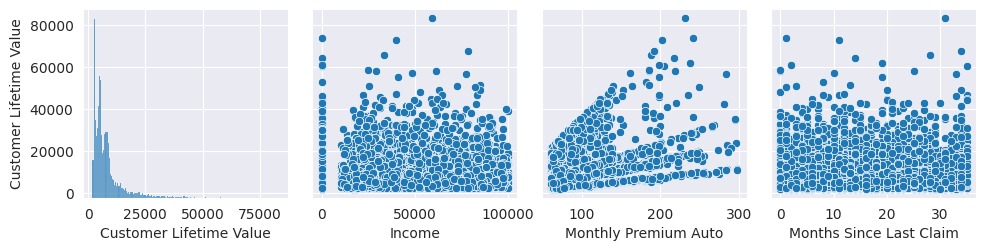

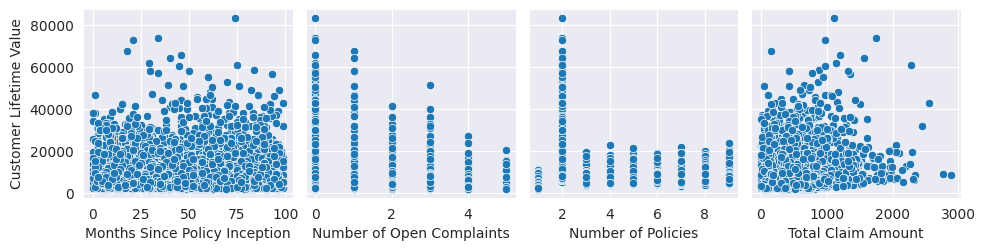

In [ ]:
for i in range(0, len(df_num.columns), 4):
    sns.pairplot(data=df_num,
                x_vars=df_num.columns[i:i+4],
                y_vars=['Customer Lifetime Value'])

1. It is important that the independent features that we are using for the prediction of target variable should be strongly correlated with the target variable.
2. There is no linear relationship between continuous independent features and CLV.
3. Linear models would not work well for the given dataset, so we may have to choose non-linear models for better prediction.

<Axes: >

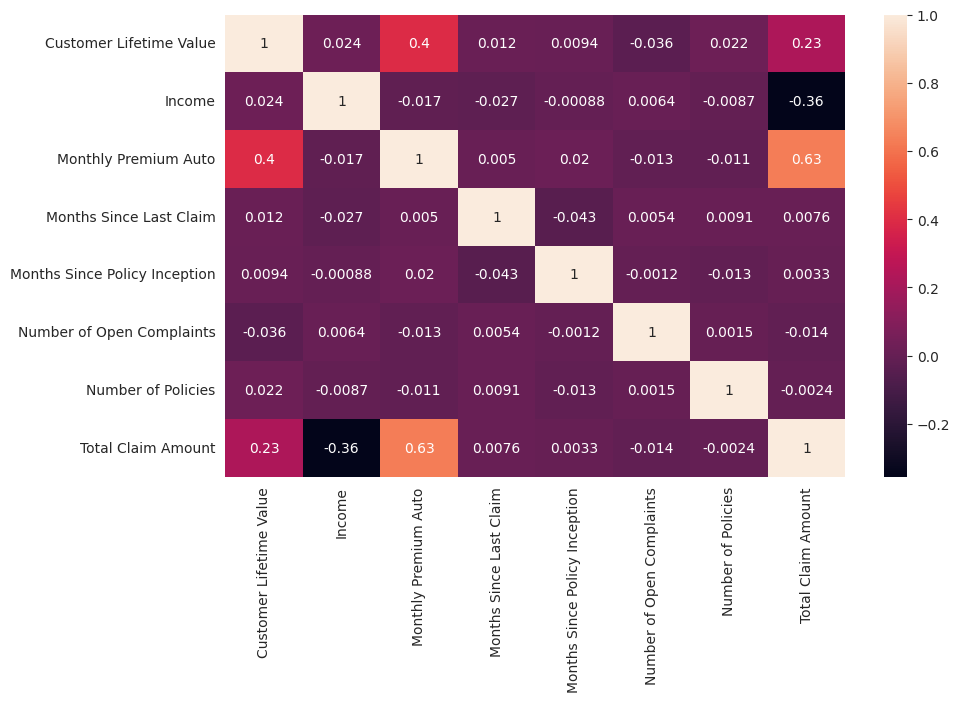

In [ ]:
plt.figure(figsize=(10,6))
sns.heatmap(df_num.corr(),annot = True)

1. None of the features are strongly correlated with the target variable (Customer Life time Value).

2. As compared to other variables the highest correlation of target variable is observed with Monthly premium Auto. It is 0.4 which indicates a weak positive correlation.

3. The highest correlation can be seen between two independent variables - Monthly premium auto and total claim amount, which is equal to 0.63.

### Now I have tried to segment customers based on their education, employment status, vehicle class, their state and location code to gain important insights and find which segment is more profitable segment. I Have created these graphs on Tableau.

### Education

![education.png](attachment:education.png)

1. People with high school education (or) below have lowest income but interestingly they have highest clv probably because their monthly premium auto highest. Also, their total claim amount is highest.
2. People with master's degree have lesser claim amount but high premium and clv. A potential profitable group to target (since no. of records for this group is less)

### Employement Status

![employment%20status.png](attachment:employment%20status.png)

1. Even though the unemployed people have no income, their monthly premium and CLV is on par with others.
2. Employed people are paying high premium but their claim amount is lowest. So they are the potential target group because they are paying more and claiming less

### State and Location Code

![state.png](attachment:state.png)

1. Majority of the customer base of the company is from Suburban region of the states.

2. Company can target customers in the urban region of Arizona and Nevada since the average CLV of customers from that area is the highest.

### Vehicle Class

![Vehicle%20class.jpg](attachment:Vehicle%20class.jpg)

1. Customers who have taken Luxury Vehicles pay more monthly premium for their vehicles and they are considered more valuable than others.
2. This proves the positive correlation of 0.4 between Monthly Premium Auto and CLV.
3. Most of the people prefers Four Door Car.

### Sales Channel

![sales%20channel.png](attachment:sales%20channel.png)

Most of the people are converted to customers by agents. So, company can invest more in agents.

### Data Preprocessing

In [ ]:
y = df['Customer Lifetime Value']
df1.head()

,State,Response,Coverage,Education,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,Washington,No,Basic,Bachelor,Employed,F,56274,Suburban,Married,69,32,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,Arizona,No,Extended,Bachelor,Unemployed,F,0,Suburban,Single,94,13,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,Nevada,No,Premium,Bachelor,Employed,F,48767,Suburban,Married,108,18,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,California,No,Basic,Bachelor,Unemployed,M,0,Suburban,Married,106,18,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,Washington,No,Basic,Bachelor,Employed,M,43836,Rural,Single,73,12,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize


In [ ]:
y_transformed = np.log1p(y)

In [ ]:
df1 = pd.get_dummies(df1,drop_first=True)
df1.shape

(9134, 50)

In [ ]:
num_features = df.dtypes[df.dtypes != 'object'].index
skewed_feat = df[num_features].apply(lambda x: x.skew()).sort_values(ascending = False)
skewness = pd.DataFrame(skewed_feat,columns = ['skew'])
skewness

,skew
Customer Lifetime Value,3.032280
Number of Open Complaints,2.783263
Monthly Premium Auto,2.123546
Total Claim Amount,1.714966
Number of Policies,1.253333
Income,0.286887
Months Since Last Claim,0.278586
Months Since Policy Inception,0.040165


### It is important to transform the skewed features before applying linear models.

In [ ]:
from scipy.special import boxcox1p
skewness_feat = ['Monthly Premium Auto','Total Claim Amount']
lam = 0.15
for i in skewness_feat:
    df1[i] = boxcox1p(df1[i],lam)

## Modelling

In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(df1,y_transformed,test_size = 0.3,random_state=4)

 ## Decision Tree Regressor

### I did the hyperparameter tuning using Randomized search CV and best parameters that I got is mentioned in the dt_tuned model.

from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint
dtc = DecisionTreeRegressor()

params = {'max_depth': sp_randint(2,20),'min_samples_leaf': sp_randint(1,20),
         'min_samples_split': sp_randint(2,40)}

rsearch = RandomizedSearchCV(dtc,param_distributions=params,n_iter=100,cv =10, scoring = 'r2')
rsearch.fit(df1,y)

In [ ]:
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor,BaggingRegressor,AdaBoostRegressor
from sklearn.pipeline import make_pipeline
from sklearn.tree import DecisionTreeRegressor
from sklearn.base import BaseEstimator,TransformerMixin,RegressorMixin,clone
from sklearn.model_selection import KFold,cross_val_score,train_test_split
from sklearn.metrics import mean_squared_error,r2_score
import xgboost as xgb

In [ ]:
dt = DecisionTreeRegressor()
dt_tuned = DecisionTreeRegressor(max_depth =  8, min_samples_leaf =  18, min_samples_split = 22)
dt_bag = BaggingRegressor(estimator=dt_tuned,n_estimators=10,random_state=0)
dt_boost = AdaBoostRegressor(estimator=dt_tuned,n_estimators=50,random_state=0)

In [ ]:
for model,name in zip([dt,dt_tuned,dt_bag,dt_boost],['decision_tree','dt_tuned','dt_bag','dt_boost']):
    print('model: {}'.format(name))
    model.fit(x_train,y_train)
    pred = model.predict(x_test)
    pred1 = model.predict(x_train)
    r2_train = r2_score(y_train,pred1)
    r2_test = r2_score(y_test,pred)
    adjusted_r_squared = abs(1 - ( (1 - r2_test) * (len(y_test) - 1)) / (len(y_test) - x_test.shape[1] - 1))
    mape = (abs((pred-y_test)/y_test).mean())*100
    print('train r2:',r2_train)
    print('test r2:',r2_test)
    print('Mape: {}'.format(mape))
    print('Adjusted R squared score is :', adjusted_r_squared)
    print('*'*60)

model: decision_tree
train r2: 1.0
test r2: 0.8207283365353346
Mape: 1.212281717174087
Adjusted R squared score is : 0.817396149482088
************************************************************
model: dt_tuned
train r2: 0.9115762293682189
test r2: 0.8971375979823305
Mape: 1.1453877206442977
Adjusted R squared score is : 0.8952256574243812
************************************************************
model: dt_bag
train r2: 0.9151751401839358
test r2: 0.9014122984401167
Mape: 1.130806223586818
Adjusted R squared score is : 0.8995798132810111
************************************************************
model: dt_boost
train r2: 0.9182209507008972
test r2: 0.8911816393117061
Mape: 1.3804705546973022
Adjusted R squared score is : 0.8891589932022583
************************************************************


In [ ]:
X_imp=pd.DataFrame(dt_tuned.feature_importances_,columns=['Imp'],index=x_test.columns)
X_imp=X_imp.sort_values(by='Imp',ascending=False)
plt.figure(figsize=(250,50))
plt.xlabel('Feature Names',fontsize=80)
plt.xticks(rotation=90,fontsize=150)
sns.barplot(x=X_imp.index,y=X_imp['Imp'])
X_imp.T

,Number of Policies,Monthly Premium Auto,Coverage_Extended,Income,EmploymentStatus_Employed,Total Claim Amount,Months Since Last Claim,Response_Yes,Number of Open Complaints,Gender_M,Coverage_Premium,Months Since Policy Inception,Education_Master,Marital Status_Single,Education_High School or Below,EmploymentStatus_Unemployed,Education_College,Marital Status_Married,Education_Doctor,EmploymentStatus_Medical Leave,Vehicle Size_Medsize,Vehicle Class_Two-Door Car,Vehicle Class_Sports Car,Vehicle Class_SUV,Vehicle Class_Luxury SUV,Vehicle Class_Luxury Car,Sales Channel_Web,Sales Channel_Call Center,Sales Channel_Branch,Renew Offer Type_Offer4,Renew Offer Type_Offer3,Renew Offer Type_Offer2,Policy_Special L3,Policy_Special L2,Policy_Special L1,Policy_Personal L3,Policy_Personal L2,Policy_Personal L1,Policy_Corporate L3,Policy_Corporate L2,Policy Type_Special Auto,Policy Type_Personal Auto,State_California,State_Nevada,Location Code_Urban,Location Code_Suburban,State_Oregon,State_Washington,EmploymentStatus_Retired,Vehicle Size_Small
Imp,0.739868,0.236042,0.006352,0.004971,0.002795,0.00225,0.001727,0.001182,0.001042,0.000773,0.000639,0.000623,0.000606,0.000316,0.000309,0.000225,0.000181,0.0001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Random Forest Regressor

In [ ]:
rf = RandomForestRegressor()
rf_tuned = RandomForestRegressor(max_depth =  36,max_features = 25,min_samples_leaf = 2,min_samples_split = 7,n_estimators=432)

In [ ]:
for model,name in zip([rf,rf_tuned],['Random Forest','Random Forest Tuned']):
    print('model: {}'.format(name))
    model.fit(x_train,y_train)
    pred = model.predict(x_test)
    pred1 = model.predict(x_train)
    r2_train = r2_score(y_train,pred1)
    r2_test = r2_score(y_test,pred)
    adjusted_r_squared = abs(1 - ( (1 - r2_test) * (len(y_test) - 1)) / (len(y_test) - x_test.shape[1] - 1))
    mape = (abs((pred-y_test)/y_test).mean())*100
    print('train r2:',r2_train)
    print('test r2:',r2_test)
    print('Mape: {}'.format(mape))
    print('Adjusted R squared score is :', adjusted_r_squared)
    print('*'*60)

model: Random Forest
train r2: 0.9873397567381718
test r2: 0.9105263957059345
Mape: 0.9753533151080747
Adjusted R squared score is : 0.9088633175592047
************************************************************
model: Random Forest Tuned
train r2: 0.9709918258867152
test r2: 0.9118788348514398
Mape: 0.9875921494766182
Adjusted R squared score is : 0.91024089497879
************************************************************


In [ ]:
X_imp=pd.DataFrame(rf_tuned.feature_importances_,columns=['Imp'],index=x_test.columns)
X_imp=X_imp.sort_values(by='Imp',ascending=False)
plt.figure(figsize=(250,50))
plt.xlabel('Feature Names',fontsize=80)
plt.xticks(rotation=90,fontsize=150)
sns.barplot(x=X_imp.index,y=X_imp['Imp'])
X_imp.T

,Number of Policies,Monthly Premium Auto,Total Claim Amount,Vehicle Class_SUV,Income,Months Since Last Claim,Months Since Policy Inception,Coverage_Extended,Vehicle Class_Luxury SUV,Vehicle Class_Luxury Car,Coverage_Premium,Number of Open Complaints,EmploymentStatus_Employed,Gender_M,Response_Yes,Marital Status_Married,Marital Status_Single,Education_College,EmploymentStatus_Unemployed,Vehicle Class_Sports Car,Renew Offer Type_Offer2,Education_High School or Below,Sales Channel_Branch,Location Code_Suburban,State_Nevada,Vehicle Class_Two-Door Car,Sales Channel_Call Center,Renew Offer Type_Offer3,Education_Master,Vehicle Size_Medsize,State_California,Policy_Personal L3,Location Code_Urban,Renew Offer Type_Offer4,State_Washington,EmploymentStatus_Medical Leave,State_Oregon,Vehicle Size_Small,Policy Type_Personal Auto,Policy_Personal L2,EmploymentStatus_Retired,Policy_Personal L1,Sales Channel_Web,Policy_Corporate L3,Policy Type_Special Auto,Policy_Special L3,Policy_Corporate L2,Policy_Special L2,Education_Doctor,Policy_Special L1
Imp,0.677777,0.183527,0.030414,0.014914,0.011482,0.010185,0.010093,0.006751,0.006593,0.00481,0.003363,0.002719,0.002672,0.00194,0.001829,0.001626,0.001518,0.001438,0.001424,0.001402,0.001381,0.00131,0.001295,0.001082,0.001071,0.001059,0.001057,0.001025,0.000994,0.000968,0.00096,0.000934,0.000851,0.00084,0.000813,0.000802,0.000802,0.000797,0.000792,0.000757,0.000667,0.000664,0.000664,0.000563,0.00041,0.000287,0.000286,0.00016,0.000157,0.000076


## GradientBoost

In [ ]:
gboost = GradientBoostingRegressor(n_estimators=1000)

In [ ]:
for model,name in zip([gboost],['Gradient Boost']):
    print('model: {}'.format(name))
    model.fit(x_train,y_train)
    pred = model.predict(x_test)
    pred1 = model.predict(x_train)
    r2_train = r2_score(y_train,pred1)
    r2_test = r2_score(y_test,pred)
    adjusted_r_squared = abs(1 - ( (1 - r2_test) * (len(y_test) - 1)) / (len(y_test) - x_test.shape[1] - 1))
    mape = (abs((pred-y_test)/y_test).mean())*100
    print('train r2:',r2_train)
    print('test r2:',r2_test)
    print('Mape: {}'.format(mape))
    print('Adjusted R squared score is :', adjusted_r_squared)

model: Gradient Boost
train r2: 0.9556863993272798
test r2: 0.903597952144449
Mape: 1.2791403514130044
Adjusted R squared score is : 0.9018060925188812


## XGBoost Regressor

In [ ]:
model_xgb = xgb.XGBRegressor()
model_xgb_tuned = xgb.XGBRegressor(learning_rate = 0.1,max_depth= 6,min_child_weight= 4,n_estimators= 70)

In [ ]:
for model,name in zip([model_xgb,model_xgb_tuned],['XG Boost','XG Boost Tuned']):
    print('model: {}'.format(name))
    model.fit(x_train,y_train)
    pred = model.predict(x_test)
    pred1 = model.predict(x_train)
    r2_train = r2_score(y_train,pred1)
    r2_test = r2_score(y_test,pred)
    adjusted_r_squared = abs(1 - ( (1 - r2_test) * (len(y_test) - 1)) / (len(y_test) - x_test.shape[1] - 1))
    mape = (abs((pred-y_test)/y_test).mean())*100
    print('train r2:',r2_train)
    print('test r2:',r2_test)
    print('Mape: {}'.format(mape))
    print('Adjusted R squared score is :', adjusted_r_squared)
    print('*'*60)

model: XG Boost
train r2: 0.9842198491197331
test r2: 0.897423259658829
Mape: 1.2348018519455466
Adjusted R squared score is : 0.895516628797469
************************************************************
model: XG Boost Tuned
train r2: 0.9412769151016305
test r2: 0.9047551078816856
Mape: 1.047822023171186
Adjusted R squared score is : 0.90298475672707
************************************************************


## Among all the models I have applied Random Forest is Performing best